## 라이브러리 import

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn           as sb
import scipy.stats       as sp

In [3]:
import tensorflow as tf
from tensorflow import keras
tf.random.set_seed(777)

스케일러 라이브러리

In [4]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
import joblib

## 데이터 불러오기

In [4]:
for i in range (100):
    temp_data = pd.read_csv('./test1_result/dp%d-blow-xy.csv'%(i+1),skiprows = 4, sep=',')
    s = "xy_dp%d = temp_data"%(i+1)
    exec(s)

In [5]:
xy_dp1

,Z [ m ],Y [ m ]
0,0.000000,-2.231890e-01
1,0.003011,-2.231076e-01
2,0.006097,-2.232591e-01
3,0.007712,-2.233659e-01
4,0.009455,-2.235481e-01
...,...,...
56,0.062608,-1.341187e-02
57,0.061721,-1.003283e-02
58,0.059674,-7.137941e-03
59,0.058237,-3.880623e-03


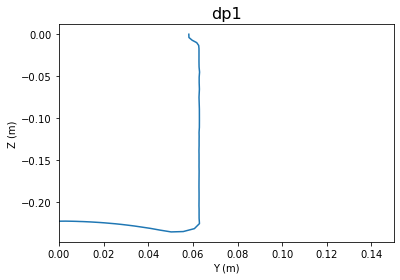

In [6]:
a = xy_dp1.iloc[:,0]
b = xy_dp1.iloc[:,1]
plt.title("dp1",fontsize = 16)
plt.xlim(0,0.15)
plt.xlabel("Y (m)")
plt.ylabel("Z (m)")
plt.plot(a,b)

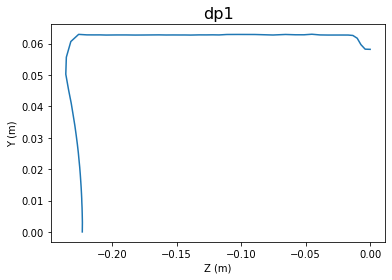

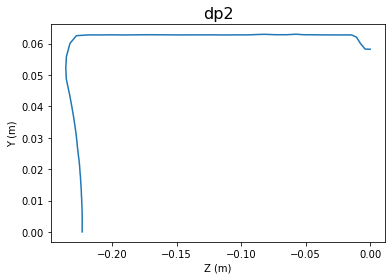

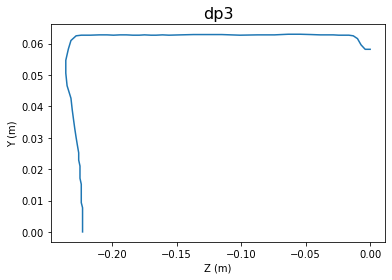

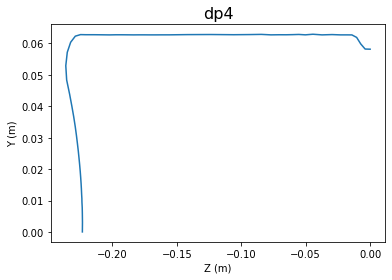

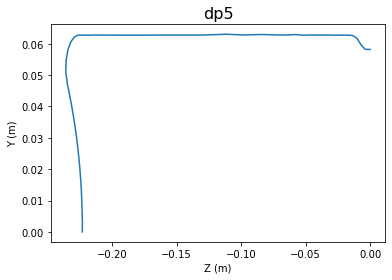

...

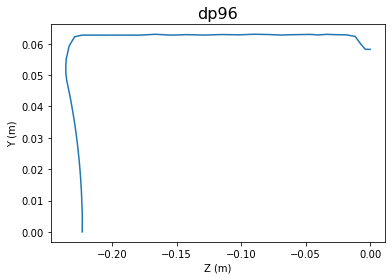

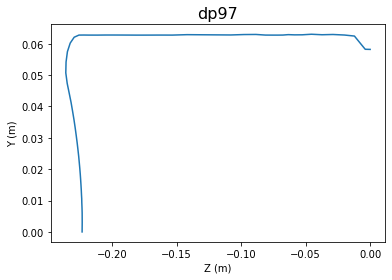

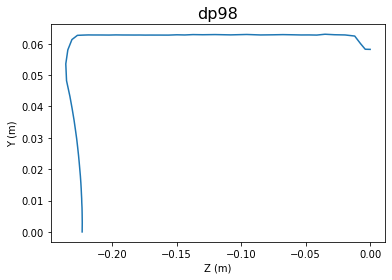

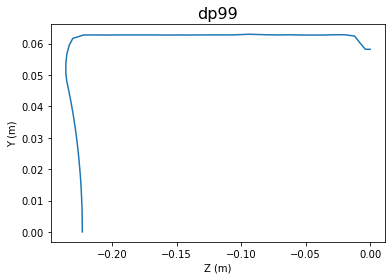

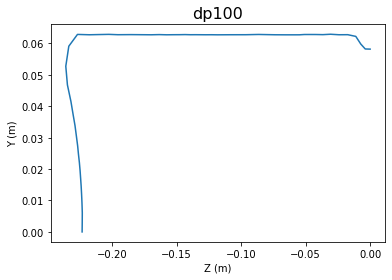

<Figure size 432x288 with 0 Axes>

In [7]:
for i in range (100):
    s = "plt.plot(xy_dp%d.iloc[:,1],xy_dp%d.iloc[:,0])"%(i+1,i+1)
    exec(s)
    plt.xlabel("Z (m)")
    plt.ylabel("Y (m)")
#     plt.xlim(0,0.3)
    # plt.ylim(0,0.003)
    plt.title("dp%d"%(i+1),fontsize = 16)
#     plt.savefig("C:/Users/SDML/Desktop/blow thickness plot/dp%d_thickness plot.jpg"%(i+1))
    plt.show()
    plt.clf()

## xy_dp 에서 자를 앞뒤 인덱스 리스트

In [117]:
# 앞뒤 자르기 
front_cut_list = []
back_cut_list  = []
for k in range (100):
    s = "temp_xy_data = xy_dp%d"%(k+1);exec(s)

    for i in range (temp_xy_data.shape[0]):
        if -0.01<(temp_xy_data.iloc[i,0]- temp_xy_data.iloc[i+1,0])/(temp_xy_data.iloc[i,1]- temp_xy_data.iloc[i+1,1])<0.01:
            front_cut_index = i
            front_cut_list = np.append(front_cut_list ,front_cut_index+1)
            print(s)
            print("front cut index : ",front_cut_index)
            break

    temp_xy_data_reverse = temp_xy_data[::-1]

    for j in range (1,temp_xy_data_reverse.shape[0]):
        if -0.01<(temp_xy_data_reverse.iloc[j,0]- temp_xy_data_reverse.iloc[j+1,0])/(temp_xy_data_reverse.iloc[j,1]- temp_xy_data_reverse.iloc[j+1,1])<0.01:
            back_cut_index = j
            back_cut_list = np.append(back_cut_list,back_cut_index+1)
            print("back cut index : ",back_cut_index)
            break




temp_xy_data = xy_dp1
front cut index :  23
back cut index :  5
temp_xy_data = xy_dp2
front cut index :  37
back cut index :  4
temp_xy_data = xy_dp3
front cut index :  26
back cut index :  5
temp_xy_data = xy_dp4
front cut index :  25
back cut index :  4
temp_xy_data = xy_dp5
front cut index :  27
back cut index :  5
temp_xy_data = xy_dp6
front cut index :  37
back cut index :  4
temp_xy_data = xy_dp7
front cut index :  19
back cut index :  5
temp_xy_data = xy_dp8
front cut index :  37
back cut index :  5
temp_xy_data = xy_dp9
front cut index :  24
back cut index :  5
temp_xy_data = xy_dp10
front cut index :  18
back cut index :  4
temp_xy_data = xy_dp11
front cut index :  30
back cut index :  5
temp_xy_data = xy_dp12
front cut index :  26
back cut index :  5
temp_xy_data = xy_dp13
front cut index :  20
back cut index :  4
temp_xy_data = xy_dp14
front cut index :  23
back cut index :  5
temp_xy_data = xy_dp15
front cut index :  27
back cut index :  4
temp_xy_data = xy_dp16
front cut i

<ipython-input-117-0ab6143169a4>:8: RuntimeWarning: divide by zero encountered in double_scalars
  if -0.01<(temp_xy_data.iloc[i,0]- temp_xy_data.iloc[i+1,0])/(temp_xy_data.iloc[i,1]- temp_xy_data.iloc[i+1,1])<0.01:



back cut index :  4
temp_xy_data = xy_dp76
front cut index :  32
back cut index :  4
temp_xy_data = xy_dp77
front cut index :  37
back cut index :  7
temp_xy_data = xy_dp78
front cut index :  22
back cut index :  4
temp_xy_data = xy_dp79
front cut index :  21
back cut index :  4
temp_xy_data = xy_dp80
front cut index :  29
back cut index :  4
temp_xy_data = xy_dp81
front cut index :  37
back cut index :  5
temp_xy_data = xy_dp82
front cut index :  34
back cut index :  4
temp_xy_data = xy_dp83
front cut index :  32
back cut index :  4
temp_xy_data = xy_dp84
front cut index :  23
back cut index :  6
temp_xy_data = xy_dp85
front cut index :  25
back cut index :  4
temp_xy_data = xy_dp86
front cut index :  21
back cut index :  4
temp_xy_data = xy_dp87
front cut index :  20
back cut index :  4
temp_xy_data = xy_dp88
front cut index :  19
back cut index :  4
temp_xy_data = xy_dp89
front cut index :  35
back cut index :  4
temp_xy_data = xy_dp90
front cut index :  21
back cut index :  4
temp

In [ ]:
for i in range (100):
    temp_data = pd.read_csv('./test1_result/dp%d-blow-thick.csv'%(i+1),skiprows = 4, sep=',')
    s = "thick_dp%d = temp_data"%(i+1)
    exec(s)

In [ ]:
for k in range(100):
    exec("temp_thick_data = thick_dp%d"%(k+1))
    for m in range(temp_thick_data.shape[0]):
        if temp_thick_data.iloc[m,0] > top_length_list[k]:
            front_cut_index = m
            break
    
    temp_thick_data_reverse = temp_thick_data[::-1]
    
    for n in range(temp_thick_data_reverse.shape[0]):
        if temp_thick_data_reverse.iloc[n,0] < temp_thick_data_reverse.iloc[0,0]-bottom_length_list[k]:
            back_cut_index = n
            break
            
    cut_temp_thick_data = temp_thick_data.iloc[front_cut_index:-back_cut_index,:]
    s2 = "cut_thickness_dp%d = cut_temp_thick_data"%(k+1);exec(s2)

## thick_dp 에서 자를 앞뒤 길이 리스트

In [9]:
bottom_length_list = []
top_length_list    = []
for k in range (100):
    exec("temp_bottom_data = xy_dp%d.iloc[:int(front_cut_list[k]),:]"%(k+1))
    
    temp_bottom_length = 0
    for i in range(temp_bottom_data.shape[0]-1):
        a = np.square(temp_bottom_data.iloc[i,0]-temp_bottom_data.iloc[i+1,0])
        b = np.square(temp_bottom_data.iloc[i,1]-temp_bottom_data.iloc[i+1,1])
        temp_bottom_length = temp_bottom_length + np.sqrt(a+b)
    bottom_length_list = np.append(bottom_length_list, temp_bottom_length)

    exec("xy_dp%d_reverse = xy_dp%d[::-1]"%(k+1,k+1))
    exec("temp_top_data = xy_dp%d_reverse.iloc[:int(back_cut_list[k]),:]"%(k+1))
    temp_top_length = 0
    for j in range(temp_top_data.shape[0]-1):
        a = np.square(temp_top_data.iloc[j,0]-temp_top_data.iloc[j+1,0])
        b = np.square(temp_top_data.iloc[j,1]-temp_top_data.iloc[j+1,1])
        temp_top_length = temp_top_length + np.sqrt(a+b)
    top_length_list = np.append(top_length_list, temp_top_length)
    
    


In [10]:
bottom_length_list

array([0.07673629, 0.07789498, 0.07337613, 0.07179063, 0.07009743,
       0.07692509, 0.075276  , 0.07464799, 0.07051057, 0.07884433,
       0.07482573, 0.0747541 , 0.08316547, 0.08548873, 0.07358303,
       0.0701773 , 0.07096487, 0.08893309, 0.07620779, 0.07353574,
       0.08810153, 0.06977791, 0.09955061, 0.07537838, 0.08681892,
       0.07101758, 0.07641101, 0.07599747, 0.08865699, 0.07225142,
       0.07372868, 0.07449798, 0.09880219, 0.07114533, 0.07682012,
       0.08558093, 0.07303421, 0.07031886, 0.07451584, 0.07716407,
       0.0743499 , 0.07587848, 0.0793552 , 0.0871905 , 0.08270228,
       0.07858544, 0.0828582 , 0.07301867, 0.07448294, 0.07403134,
       0.07607158, 0.07593488, 0.07678461, 0.07714162, 0.07057257,
       0.08912747, 0.07211088, 0.07063088, 0.0699943 , 0.07284802,
       0.09716013, 0.08937744, 0.07482359, 0.07582016, 0.07021838,
       0.07958151, 0.06931112, 0.06949944, 0.07151798, 0.07113821,
       0.07561602, 0.08649812, 0.07116654, 0.07243582, 0.07252

## 모든 data slicing 1

In [11]:
for i in range (100):
    temp_data = pd.read_csv('./test1_result/dp%d-blow-thick.csv'%(i+1),skiprows = 4, sep=',')
    s = "thick_dp%d = temp_data"%(i+1)
    exec(s)

In [12]:
for k in range(100):
    exec("temp_thick_data = thick_dp%d"%(k+1))
    for m in range(temp_thick_data.shape[0]):
        if temp_thick_data.iloc[m,0] > top_length_list[k]:
            front_cut_index = m
            break
    
    temp_thick_data_reverse = temp_thick_data[::-1]
    
    for n in range(temp_thick_data_reverse.shape[0]):
        if temp_thick_data_reverse.iloc[n,0] < temp_thick_data_reverse.iloc[0,0]-bottom_length_list[k]:
            back_cut_index = n
            break
            
    cut_temp_thick_data = temp_thick_data.iloc[front_cut_index:-back_cut_index,:]
    s2 = "cut_thickness_dp%d = cut_temp_thick_data"%(k+1);exec(s2)

In [13]:
cut_thickness_dp1

,Curve Length on Polyline 1 [ m ],THICKNESS [ m ]
9,0.018458,0.000639
10,0.020766,0.000563
11,0.023228,0.000525
12,0.025537,0.000469
13,0.028286,0.000401
14,0.031332,0.000353
15,0.034518,0.000308
16,0.038071,0.000259
17,0.042211,0.000210
18,0.046897,0.000173


In [14]:
# for i in range(100):
#     exec("pd.DataFrame(cut_thickness_dp%d).to_csv('D:/testoneblow/sidewall thickness data/dp%d-blow-thick-sidewallcut.csv')"%(i+1,i+1))

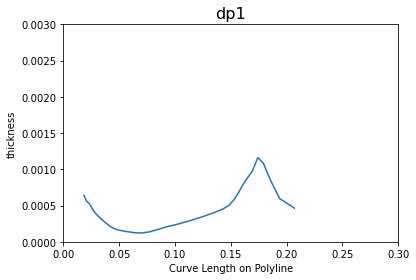

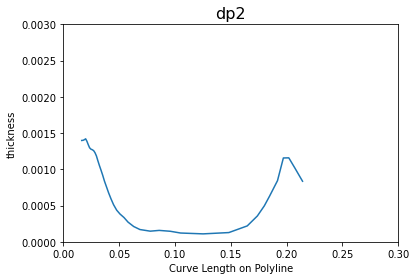

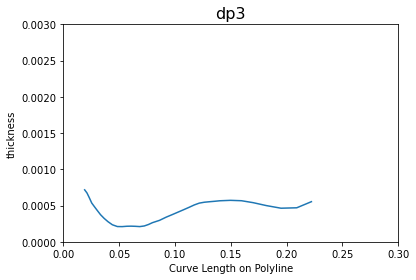

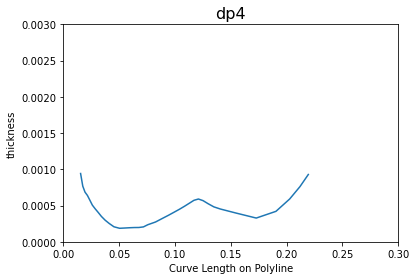

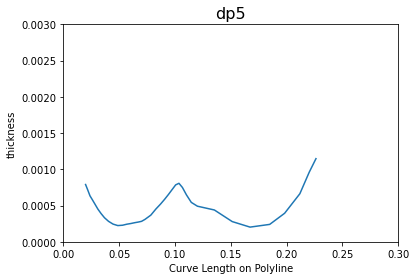

...

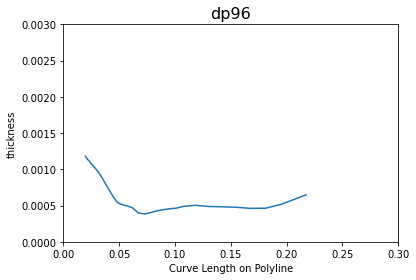

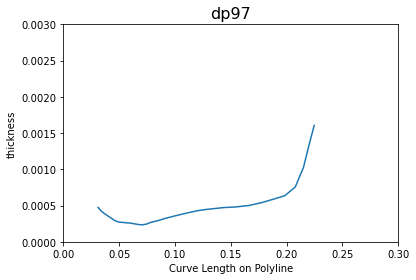

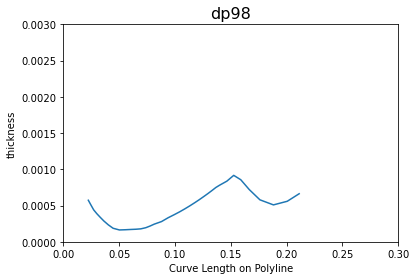

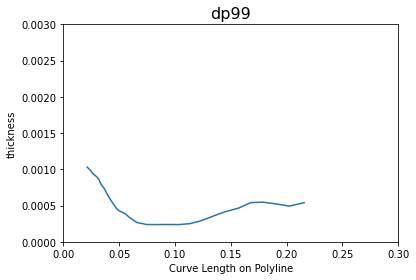

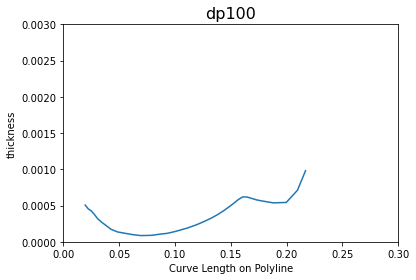

<Figure size 432x288 with 0 Axes>

In [15]:
for i in range (100):
    s = "plt.plot(cut_thickness_dp%d.iloc[:,0],cut_thickness_dp%d.iloc[:,1])"%(i+1,i+1)
    exec(s)
    plt.xlabel("Curve Length on Polyline")
    plt.ylabel("thickness")
    plt.xlim(0,0.3)
    plt.ylim(0,0.003)
    plt.title("dp%d"%(i+1),fontsize = 16)
#     plt.savefig("C:/Users/SDML/Desktop/blow thickness plot/dp%d_thickness plot.jpg"%(i+1))
    plt.show()
#     plt.close()
    plt.clf()


## 모든 data slicing 2

In [108]:
front_cut_list

array([24., 38., 27., 26., 28., 38., 20., 38., 25., 19., 31., 27., 21.,
       24., 28., 34., 30., 26., 37., 21., 21., 24., 24., 32., 27., 24.,
       34., 36., 26., 22., 29., 20., 23., 38., 21., 26., 24., 33., 20.,
       22., 35., 35., 24., 22., 22., 21., 23., 32., 35., 29., 24., 35.,
       37., 25., 21., 24., 28., 24., 34., 35., 23., 21., 20., 30., 20.,
       36., 20., 22., 26., 31., 20., 22., 20., 25., 29., 33., 38., 23.,
       22., 30., 38., 35., 33., 24., 26., 22., 21., 20., 36., 22., 38.,
       20., 20., 29., 30., 38., 29., 26., 36., 22.])

In [109]:
back_cut_list

array([ 6.,  5.,  6.,  5.,  6.,  5.,  6.,  6.,  6.,  5.,  6.,  6.,  5.,
        6.,  5.,  5.,  6.,  6.,  5.,  5.,  6.,  6.,  6.,  5.,  6.,  5.,
        5.,  5.,  5.,  7.,  5.,  5.,  6.,  5.,  6.,  6.,  6.,  5.,  6.,
        5.,  5.,  5.,  5.,  5.,  5.,  5.,  5.,  5.,  5.,  5.,  5.,  5.,
        5.,  5.,  5.,  5.,  5., 10.,  5.,  5.,  5.,  7.,  5.,  5.,  5.,
        5.,  5.,  5.,  5.,  5.,  5.,  5.,  5.,  6.,  5.,  5.,  8.,  5.,
        5.,  5.,  6.,  5.,  5.,  7.,  5.,  5.,  5.,  5.,  5.,  5.,  5.,
        5.,  5.,  5.,  7.,  5.,  6.,  5.,  5.,  5.])

In [111]:
for k in range(100):
    exec("temp_thick_data = thick_dp%d"%(k+1))
            
    cut_temp_thick_data = temp_thick_data.iloc[int(back_cut_list[k]):int(-front_cut_list[k]),:]
    s2 = "cut2_thickness_dp%d = cut_temp_thick_data"%(k+1);exec(s2)

In [113]:
cut_thickness_dp1

,Curve Length on Polyline 1 [ m ],THICKNESS [ m ]
9,0.018458,0.000639
10,0.020766,0.000563
11,0.023228,0.000525
12,0.025537,0.000469
13,0.028286,0.000401
14,0.031332,0.000353
15,0.034518,0.000308
16,0.038071,0.000259
17,0.042211,0.000210
18,0.046897,0.000173


In [112]:
cut2_thickness_dp1

,Curve Length on Polyline 1 [ m ],THICKNESS [ m ]
6,0.012178,0.001212
7,0.014212,0.001056
8,0.016212,0.000806
9,0.018458,0.000639
10,0.020766,0.000563
11,0.023228,0.000525
12,0.025537,0.000469
13,0.028286,0.000401
14,0.031332,0.000353
15,0.034518,0.000308


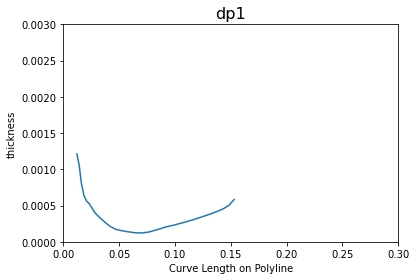

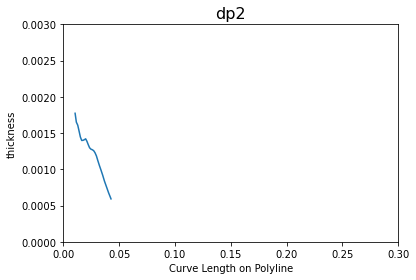

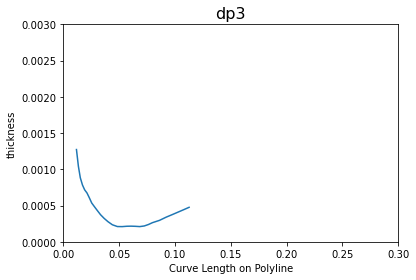

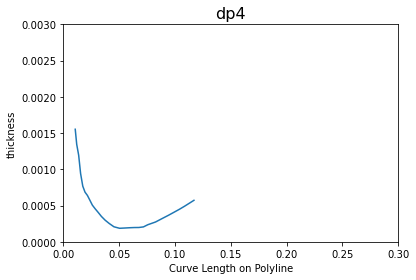

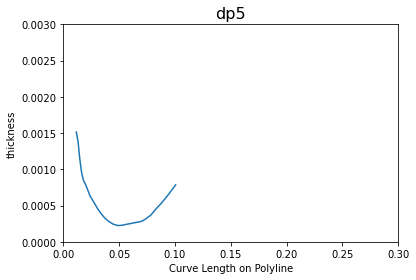

...

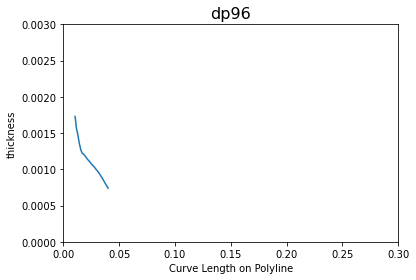

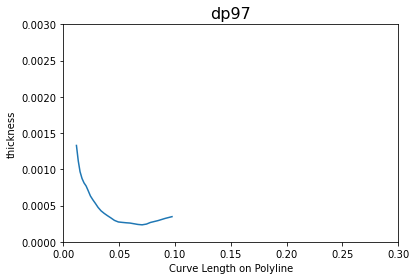

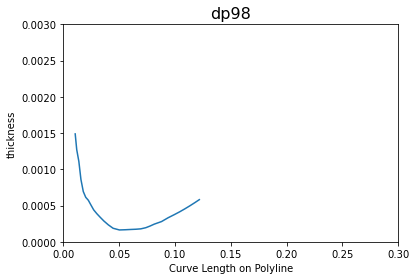

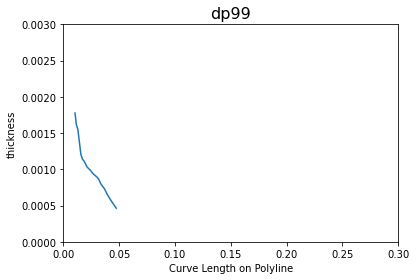

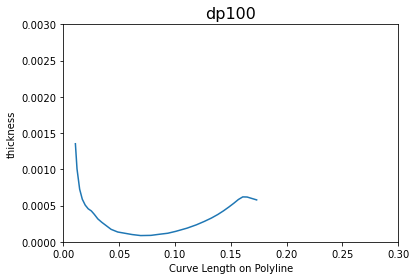

<Figure size 432x288 with 0 Axes>

In [114]:
for i in range (100):
    s = "plt.plot(cut2_thickness_dp%d.iloc[:,0],cut2_thickness_dp%d.iloc[:,1])"%(i+1,i+1)
    exec(s)
    plt.xlabel("Curve Length on Polyline")
    plt.ylabel("thickness")
    plt.xlim(0,0.3)
    plt.ylim(0,0.003)
    plt.title("dp%d"%(i+1),fontsize = 16)
#     plt.savefig("C:/Users/SDML/Desktop/blow thickness plot/dp%d_thickness plot.jpg"%(i+1))
    plt.show()
#     plt.close()
    plt.clf()


## inputdata

In [128]:
for i in range (1):
    temp_data = pd.read_csv('./test3/dp%d-blow-thick.csv'%(i+1),skiprows = 4, sep=',')
    s = "blow_thick_dp%d = temp_data"%(i+1)
    exec(s)

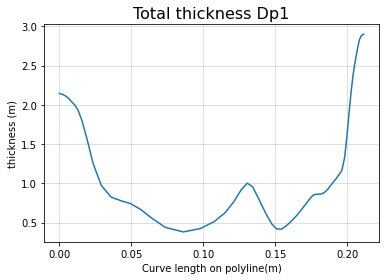

In [129]:
plt.grid(alpha = 0.5)
plt.title("Total thickness Dp1",fontsize = 16)
plt.xlabel("Curve length on polyline(m)")
plt.ylabel("thickness (m)")
plt.plot(blow_thick_dp1.iloc[:,0],blow_thick_dp1.iloc[:,1])
plt.savefig("C:/Users/SDML/Desktop/figure2.jpg")

In [6]:
inputdata = pd.read_csv('./input-test1.csv',skiprows = 6, sep=',')
inputdata

,Name,P1,P2,P3,P4,P5,P6,P7,P8,P10
0,DP 0,80,120.0,110.0,100.0,98.0,85.0,80.0,80.0,0.002414
1,DP 1,80,80.2,105.4,103.8,114.2,82.2,99.8,100.6,0.002639
2,DP 2,80,80.6,83.8,97.0,105.8,86.2,113.4,81.8,0.002597
3,DP 3,80,81.0,93.8,115.0,118.6,105.4,98.2,98.6,0.002549
4,DP 4,80,81.4,107.8,87.4,98.6,108.2,87.8,91.8,0.002536
...,...,...,...,...,...,...,...,...,...,...
96,DP 96,80,118.2,108.2,116.6,117.0,106.2,94.6,82.6,0.002395
97,DP 97,80,118.6,109.8,80.6,109.8,107.0,99.4,94.2,0.002536
98,DP 98,80,119.0,104.6,109.8,111.0,89.4,93.0,97.0,0.002611
99,DP 99,80,119.4,80.6,100.2,119.4,109.8,109.4,89.8,0.002535


In [7]:
TrainData = inputdata.iloc[1:,1:-1]
TrainData

,P1,P2,P3,P4,P5,P6,P7,P8
1,80,80.2,105.4,103.8,114.2,82.2,99.8,100.6
2,80,80.6,83.8,97.0,105.8,86.2,113.4,81.8
3,80,81.0,93.8,115.0,118.6,105.4,98.2,98.6
4,80,81.4,107.8,87.4,98.6,108.2,87.8,91.8
5,80,81.8,85.4,107.8,97.0,119.0,83.0,94.6
...,...,...,...,...,...,...,...,...
96,80,118.2,108.2,116.6,117.0,106.2,94.6,82.6
97,80,118.6,109.8,80.6,109.8,107.0,99.4,94.2
98,80,119.0,104.6,109.8,111.0,89.4,93.0,97.0
99,80,119.4,80.6,100.2,119.4,109.8,109.4,89.8


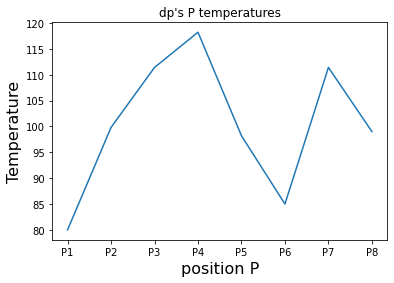

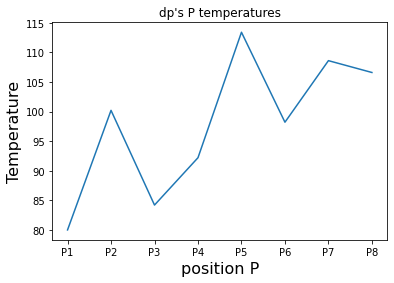

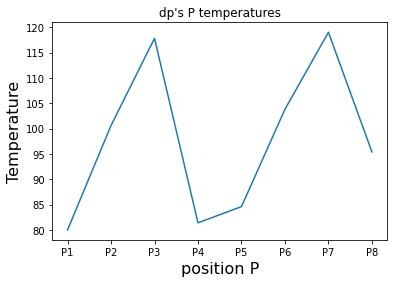

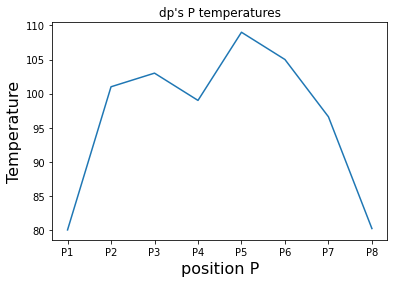

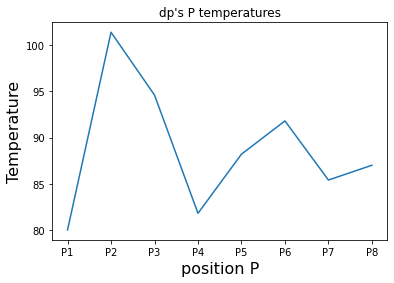

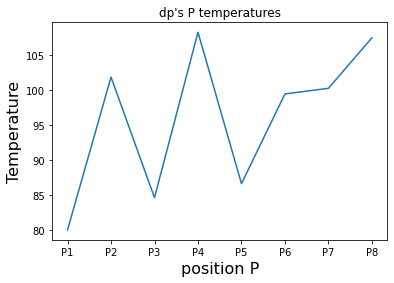

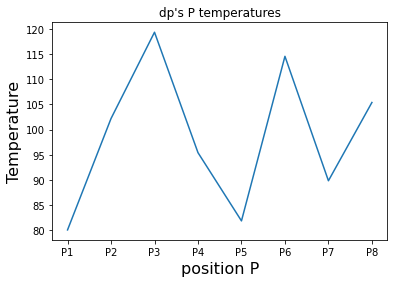

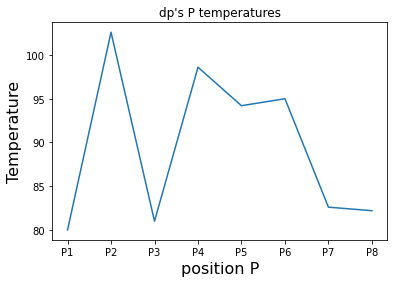

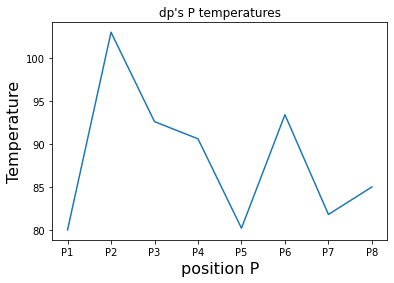

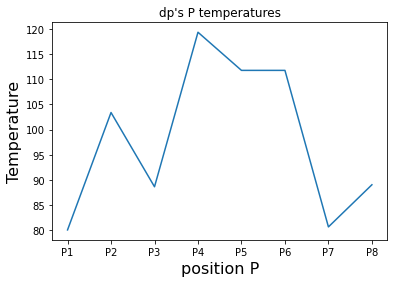

In [39]:
plt.clf()
for i in range(int(inputdata.shape[0]/10)):
    plt.title("dp's P temperatures")
    plt.ylabel("Temperature", fontsize='16')
    plt.xlabel("position P", fontsize='16')
    plt.plot(inputdata.iloc[i+50,1:-1])
#     plt.savefig("D:/testoneblow/input data plot/dptempdata.jpg")
    plt.show()

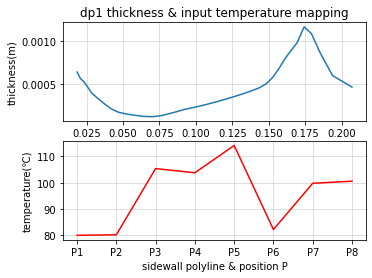

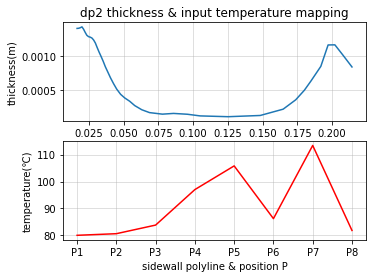

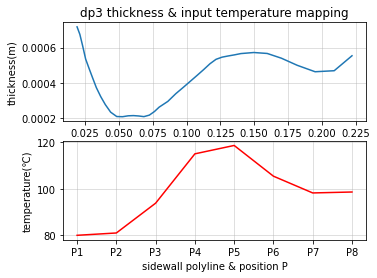

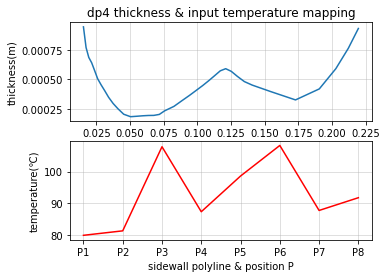

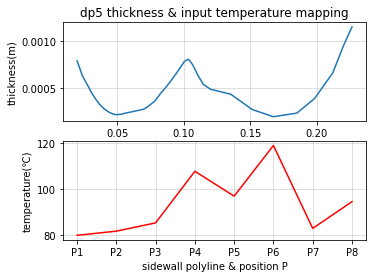

...

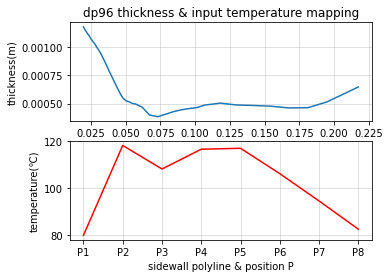

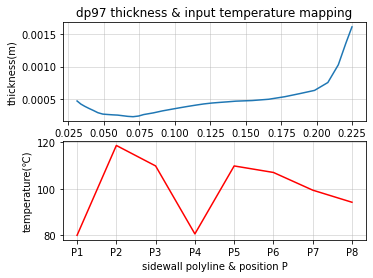

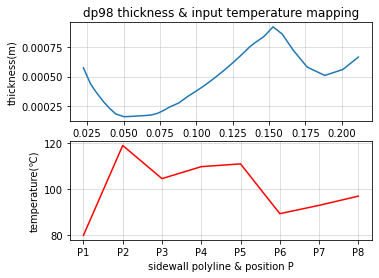

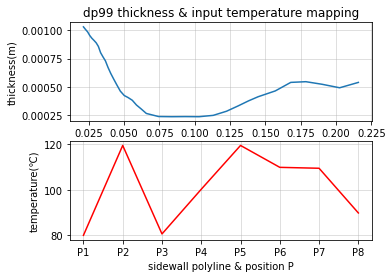

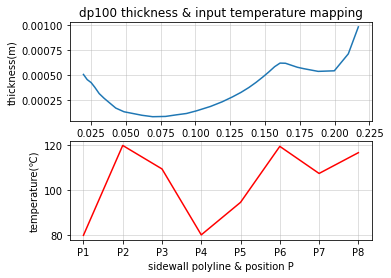

In [56]:
for i in range (100):
    plt.subplot(211)
    plt.grid(alpha = 0.5)
    plt.title("dp%d thickness & input temperature mapping"%(i+1))
    plt.xlabel("Curve length on polyline")
    plt.ylabel("thickness(m)")
    exec("plt.plot(cut_thickness_dp%d.iloc[:,0],cut_thickness_dp%d.iloc[:,1])"%(i+1,i+1))

    plt.subplot(212)
    plt.grid(alpha = 0.5)
    plt.xlabel("sidewall polyline & position P")
    plt.ylabel("temperature(℃)")
    plt.plot(inputdata.iloc[i+1,1:-1], c = "r")
    plt.gcf().subplots_adjust(left=0.20)
    plt.savefig("D:/testoneblow/pictures/sidewall thick&temp mapping/dp%d.jpg"%(i+1))
    plt.show()

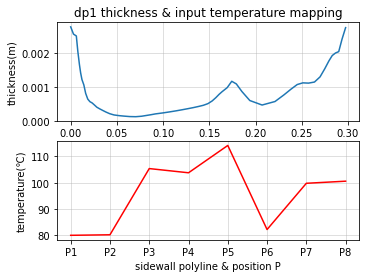

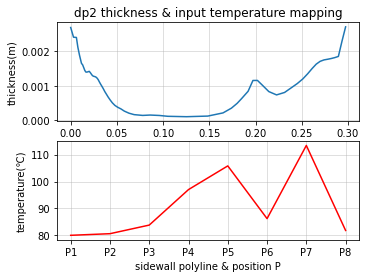

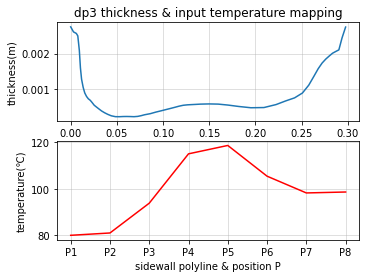

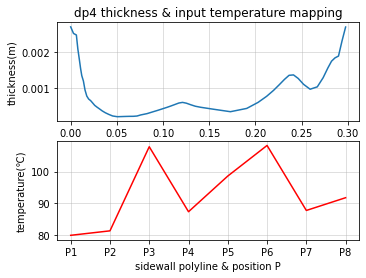

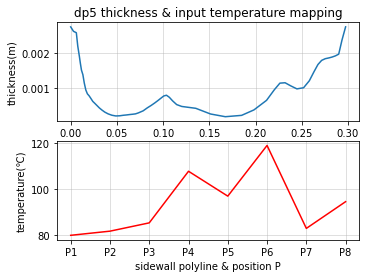

...

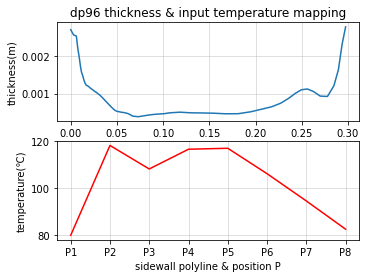

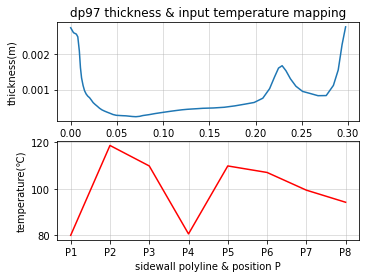

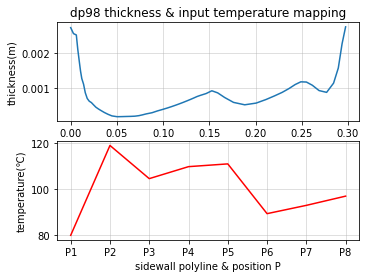

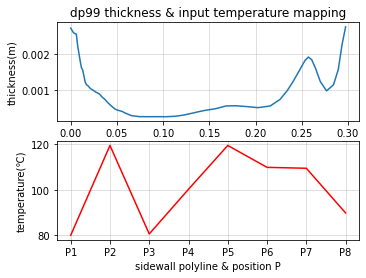

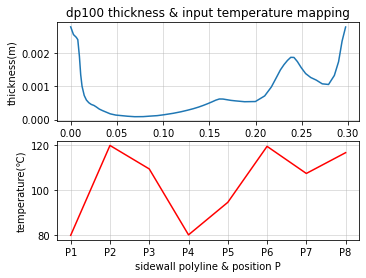

In [57]:
for i in range (100):
    plt.subplot(211)
    plt.grid(alpha = 0.5)
    plt.title("dp%d thickness & input temperature mapping"%(i+1))
    plt.xlabel("Curve length on polyline")
    plt.ylabel("thickness(m)")
    exec("plt.plot(thick_dp%d.iloc[:,0],thick_dp%d.iloc[:,1])"%(i+1,i+1))

    plt.subplot(212)
    plt.grid(alpha = 0.5)
    plt.xlabel("sidewall polyline & position P")
    plt.ylabel("temperature(℃)")
    plt.plot(inputdata.iloc[i+1,1:-1], c = "r")
    plt.gcf().subplots_adjust(left=0.20)
    plt.savefig("D:/testoneblow/pictures/total thick&temp mapping/dp%d.jpg"%(i+1))
    plt.show()

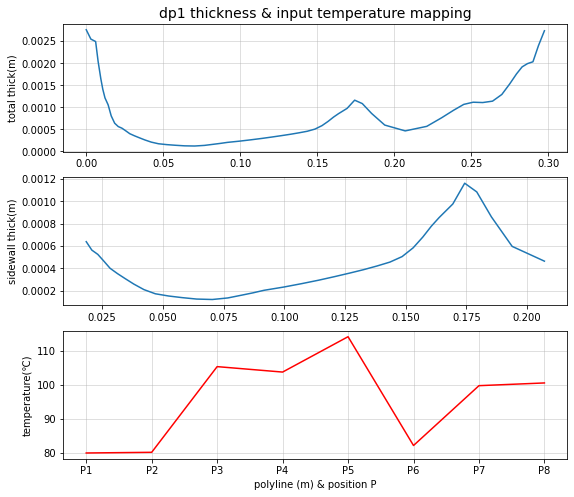

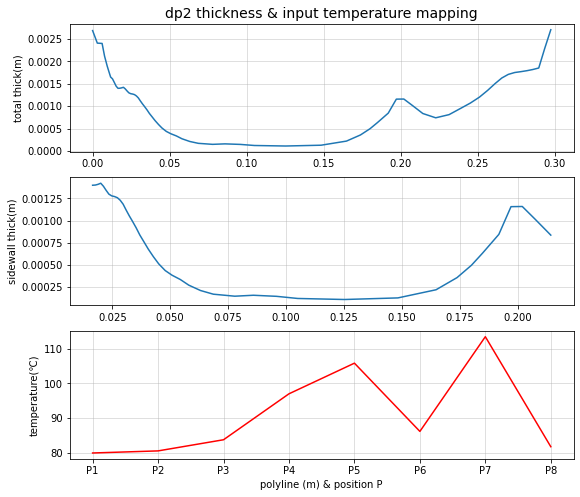

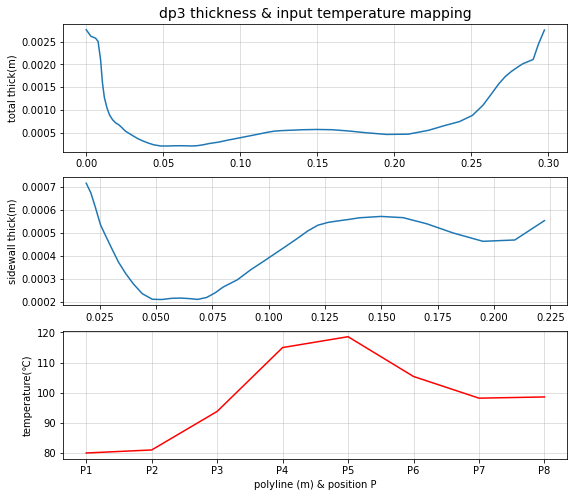

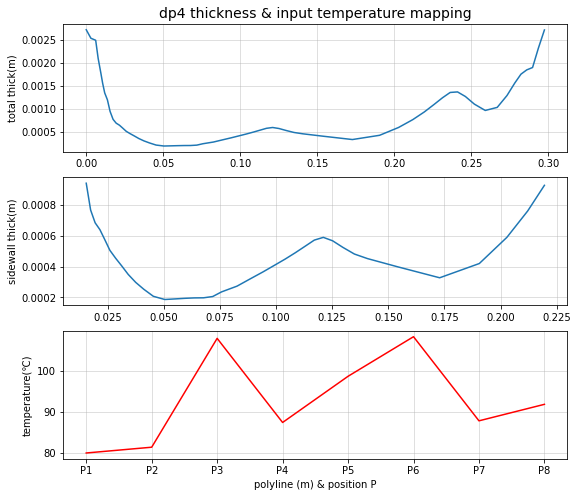

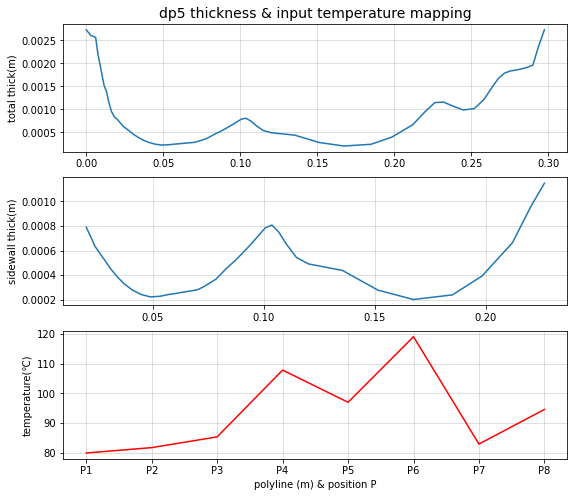

...

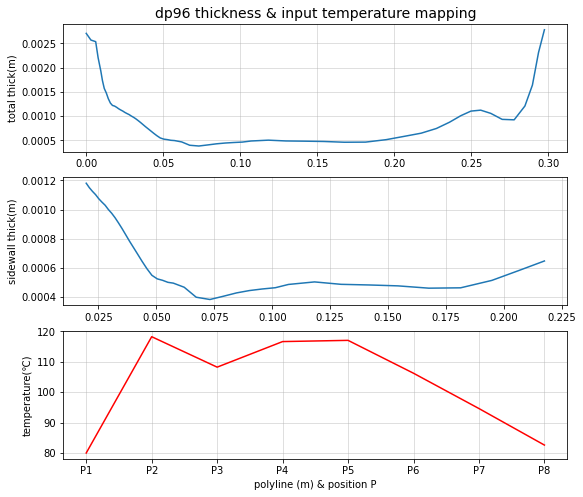

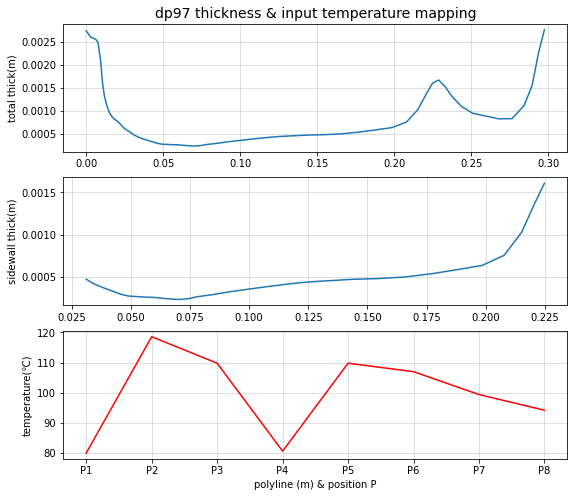

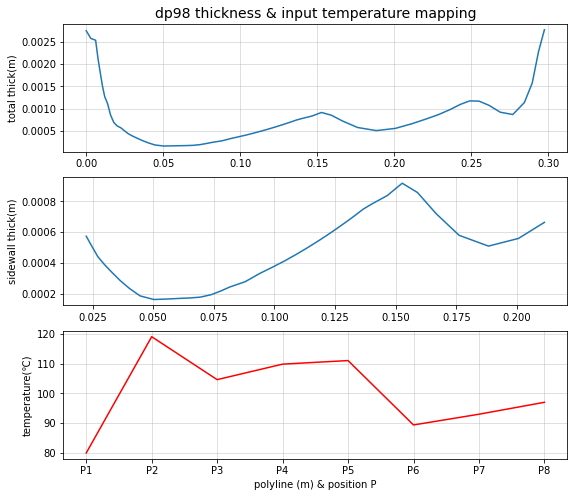

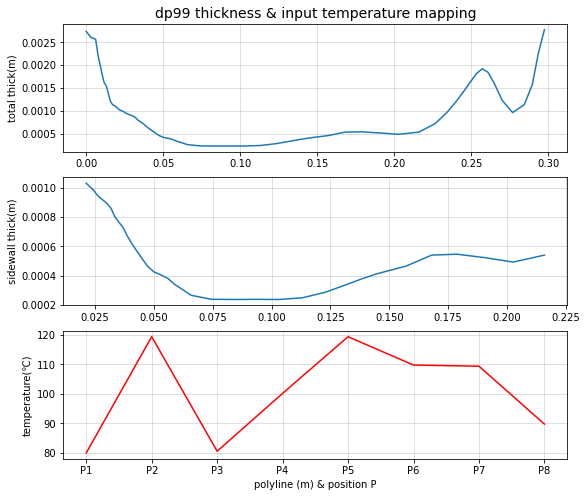

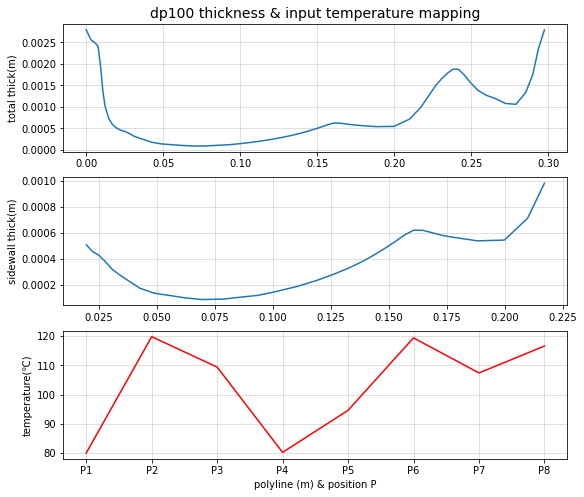

In [100]:
for i in range (100):
    plt.figure(figsize = (10,8))
    plt.subplot(311)
    plt.grid(alpha = 0.5)
    plt.title("dp%d thickness & input temperature mapping"%(i+1), fontsize = 14)
#     plt.xlabel("Curve length on polyline")
#     plt.xticks(fontsize = 7)
    plt.ylabel("total thick(m)")
    exec("plt.plot(thick_dp%d.iloc[:,0],thick_dp%d.iloc[:,1])"%(i+1,i+1))
    
    plt.subplot(312)
    plt.grid(alpha = 0.5)
#     plt.xlabel("Curve length on polyline")
#     plt.xticks(fontsize = 7)
    plt.ylabel("sidewall thick(m)")
    exec("plt.plot(cut_thickness_dp%d.iloc[:,0],cut_thickness_dp%d.iloc[:,1])"%(i+1,i+1))

    plt.subplot(313)
    plt.grid(alpha = 0.5)
    plt.xlabel("polyline (m) & position P")
    plt.ylabel("temperature(℃)")
    plt.plot(inputdata.iloc[i+1,1:-1], c = "r")
    plt.gcf().subplots_adjust(left=0.20)

    plt.savefig("D:/testoneblow/pictures/total+sidewall thick&temp mapping/dp%d.jpg"%(i+1))
    plt.show()

In [8]:
for i in range (100):
    temp_data = pd.read_csv('./test1/dp%d-preform-temp.csv'%(i+1),skiprows = 4, sep=',')
    s = "preform_temp_dp%d = temp_data"%(i+1)
    exec(s)

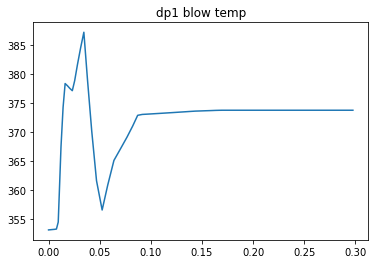

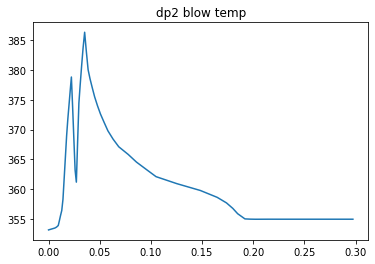

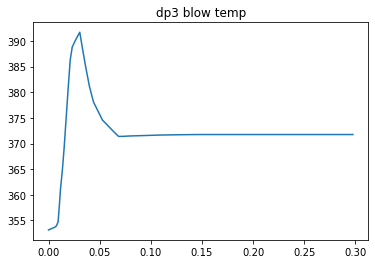

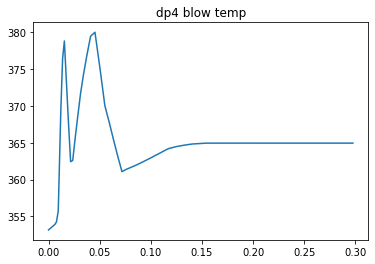

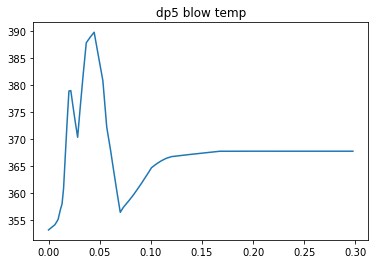

...

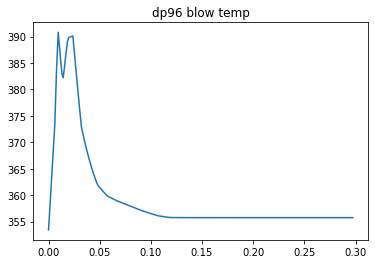

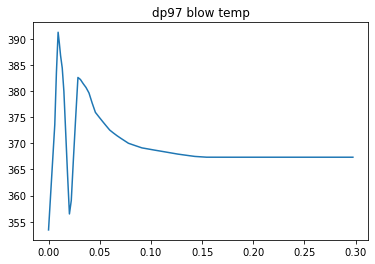

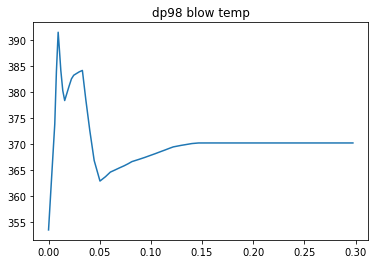

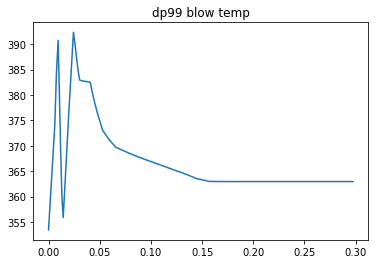

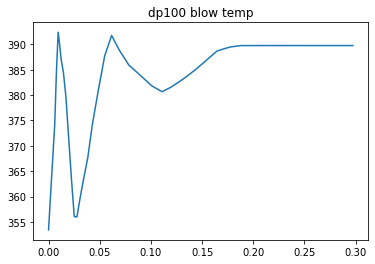

<Figure size 432x288 with 0 Axes>

In [122]:
for i in range(100):
#     plt.subplot(211)
#     plt.plot(inputdata.iloc[i+1,1:-1])

#     plt.subplot(212)
    # preform temp 순서 거꾸로 뒤집어 줘야함!!!
    plt.title("dp%d blow temp"%(i+1))
    exec("plt.plot(blow_temp_dp%d.iloc[:,0],blow_temp_dp%d.iloc[:,1][::-1])"%(i+1,i+1))
    plt.show()
    plt.clf()
    

NameError: name 'thick_dp1' is not defined

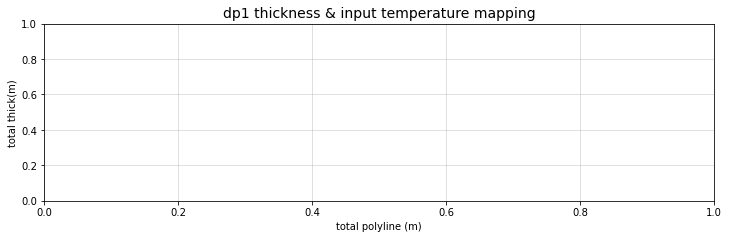

In [9]:
for i in range (100):
    plt.figure(figsize = (12,15))
    plt.subplot(411)
    plt.grid(alpha = 0.5)
    plt.title("dp%d thickness & input temperature mapping"%(i+1), fontsize = 14)
    plt.xlabel("total polyline (m)")
#     plt.xticks(fontsize = 7)
    plt.ylabel("total thick(m)")
    exec("plt.plot(thick_dp%d.iloc[:,0],thick_dp%d.iloc[:,1])"%(i+1,i+1))
    
    plt.subplot(412)
    plt.grid(alpha = 0.5)
    plt.xlabel("sidewall polyline (m)")
#     plt.xticks(fontsize = 7)
    plt.ylabel("sidewall thick(m)")
    exec("plt.plot(cut_thickness_dp%d.iloc[:,0],cut_thickness_dp%d.iloc[:,1])"%(i+1,i+1))

    plt.subplot(413)
    plt.grid(alpha = 0.5)
    plt.xlabel("P position")
    plt.ylabel("temperature(℃)")
    plt.plot(inputdata.iloc[i+1,1:-1], c = "r")
    
    plt.subplot(414)
    plt.grid(alpha = 0.5)
    plt.xlabel("preform position (m)")
    plt.ylabel("temperature (K)")
    exec("plt.plot(preform_temp_dp%d.iloc[:,0],preform_temp_dp%d.iloc[:,1][::-1], c = 'r')"%(i+1,i+1))
    plt.xlabel("polyline (m) / position P & preform temperature")
    plt.gcf().subplots_adjust(left=0.20)

    plt.savefig("D:/testoneblow/pictures/total+sidewall thick&temp&preformtemp mapping/dp%d.jpg"%(i+1))
    plt.show()

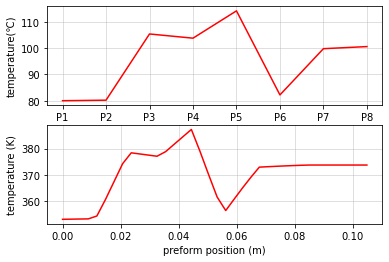

In [15]:
for i in range (1):
    plt.title("P1~P8 vs. 37 Preform temperature")
    plt.subplot(211)
    plt.grid(alpha = 0.5)
    plt.xlabel("P position")
    plt.ylabel("temperature(℃)")
    plt.plot(inputdata.iloc[i+1,1:-1], c = "r")
    
    plt.subplot(212)
    plt.grid(alpha = 0.5)
    plt.xlabel("preform position (m)")
    plt.ylabel("temperature (K)")
    exec("plt.plot(preform_temp_dp%d.iloc[:,0],preform_temp_dp%d.iloc[:,1][::-1], c = 'r')"%(i+1,i+1))
    
#     plt.xlabel("polyline (m) / position P & preform temperature")
#     plt.gcf().subplots_adjust(left=0.20)

#     plt.savefig("D:/testoneblow/pictures/total+sidewall thick&temp&preformtemp mapping/dp%d.jpg"%(i+1))
    plt.show()